In [1]:
import torch
import cv2
import numpy as np
import matplotlib.pyplot as plt
from utils import image_resize, generate_lines
import plotly.graph_objects as go
from tqdm import tqdm

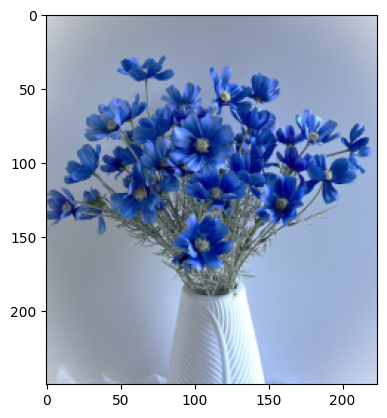

In [2]:
image = cv2.imread("/home/sahcim/dev/uwr-data-science-master/deep-lab/l1/kwiaty.jpg")
image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
image = image_resize(image, 224)
image = image / 255.0
plt.imshow(image)

In [3]:
image_flat = image.reshape((-1, 3))
fig = go.Figure(data=[go.Scatter3d(x=image_flat[:,0], y=image_flat[:,1], z=image_flat[:,2],
                                   mode='markers', marker=dict(size=2,color=image_flat, opacity=0.8))])
fig.update_layout(width=700, height=700, showlegend=False)
fig.show()

In [4]:
rank = 5
NY, NX, NZ = np.meshgrid(np.arange(7), np.arange(7), np.arange(10))
topology = np.stack([NY, NX, NZ], axis=-1)
print(topology.shape)
#lines = generate_lines(rank, rank, rank)

flat_topology = topology.reshape((-1, 3))

"""
fig = go.Figure()
line_marker = dict(color='#000000', width=2)
for line in lines:
    x1,y1,z1 = line[0]
    x2,y2,z2 = line[1]

    point1 = topology[y1,x1,z1]
    point2 = topology[y2,x2,z2]

    xx = np.array([point1[1], point2[1]])
    yy = np.array([point1[0], point2[0]])
    zz = np.array([point1[2], point2[2]])
    fig.add_scatter3d(x=xx, y=yy, z=zz, mode='lines', line=line_marker, name='')

fig.add_scatter3d(x=flat_topology[:,1], y=flat_topology[:,0], z=flat_topology[:,2], mode='markers', marker=dict(size=3, opacity=0.8, symbol="x", color='black'))
fig.update_layout(width=700, height=700, showlegend=False)
fig.show()
"""
print(flat_topology.shape)

(7, 7, 10, 3)
(490, 3)


In [8]:
K = flat_topology.shape[0]
C = np.zeros((K, K))
for ni in tqdm(range(K)):
    for nj in range(K):
        # C[ni, nj] = np.maximum(0.0,
        #                        1.0 - np.abs(centroid_topology[ni] - centroid_topology[nj]).sum()/2.0)
        C[ni, nj] = np.maximum(0.0,
                               1-np.abs(flat_topology[ni]-flat_topology[nj]).sum()/2)

  0%|          | 0/490 [00:00<?, ?it/s]

100%|██████████| 490/490 [00:00<00:00, 980.84it/s]


In [9]:
C[:5, :5]

array([[1. , 0.5, 0. , 0. , 0. ],
       [0.5, 1. , 0.5, 0. , 0. ],
       [0. , 0.5, 1. , 0.5, 0. ],
       [0. , 0. , 0.5, 1. , 0.5],
       [0. , 0. , 0. , 0.5, 1. ]])

In [7]:
fig = go.Figure()
line_marker = dict(color='#000000', width=2)
for ni, nj in zip(*np.nonzero(C)):
    if ni < nj:
        p1 = flat_topology[ni]
        p2 = flat_topology[nj]
        fig.add_scatter3d(x=[p1[1], p2[1]], y=[p1[0], p2[0]], z=[p1[2], p2[2]], mode='lines', line=line_marker, name='')
        
fig.update_layout(width=700, height=700, showlegend=False)
#fig.show()

In [ ]:
N, D = image_flat.shape

In [ ]:
initial_center_ids = np.random.choice(N, (K,), replace=False)

In [ ]:
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
torch_img = torch.tensor(image_flat, dtype=torch.float32).to(device).requires_grad_(False)
torch_C = torch.tensor(C, dtype=torch.float32).to(device).requires_grad_(False)
torch_centers = torch_img[initial_center_ids].clone().detach().to(device).requires_grad_(False)

In [ ]:
def train(torch_img, torch_C, torch_centers, device="cpu"):
    alpha = 0.01
    iters = 500000
    batch_size = 4096
    K = torch_C.shape[0]
    for i in tqdm(range(iters)):
        sampled_x = torch_img[torch.randint(N, (batch_size,), device=device)]
        cluster_id = torch.argmin(torch.cdist(torch_centers, sampled_x), axis=0)
        cluster_alpha = (alpha * torch_C[cluster_id]).unsqueeze(-1)
        torch_centers = ((1 - cluster_alpha) * torch_centers + cluster_alpha * sampled_x.unsqueeze(1)).mean(axis=0)
        if i % 100000 == 0:
            #center_to_cluster_dists = distance.cdist(centers, im_flat)
            center_to_cluster_dists = torch.cdist(torch_centers, torch_img)
            cluster_assignment = torch.argmin(center_to_cluster_dists, axis=0)
            loss = ((torch_centers[cluster_assignment] - torch_img)**2).sum()
            print ("Iteration: %d Loss: %g" % (i, loss))
    return torch_centers

In [174]:
func = torch.compile(train)
result = func(torch_img, torch_C, torch_centers, device=device)

  0%|          | 613/500000 [00:00<01:21, 6125.19it/s]

Iteration: 0 Loss: 28.8567


 20%|██        | 100721/500000 [00:16<01:05, 6124.99it/s]

Iteration: 100000 Loss: 39.5116


 40%|████      | 201142/500000 [00:33<00:49, 5992.77it/s]

Iteration: 200000 Loss: 33.6343


 60%|██████    | 300987/500000 [00:50<00:33, 5893.08it/s]

Iteration: 300000 Loss: 29.0711


 80%|████████  | 400911/500000 [01:07<00:16, 6004.18it/s]

Iteration: 400000 Loss: 26.1602


100%|██████████| 500000/500000 [01:23<00:00, 5970.40it/s]


In [ ]:
result_cpu = result.cpu().detach().numpy()

In [ ]:
fig = go.Figure()
line_marker = dict(color='#000000', width=1)
for ni, nj in zip(*np.nonzero(C)):
    if ni < nj:
        p1 = result_cpu[ni]
        p2 = result_cpu[nj]
        fig.add_scatter3d(x=[p1[1], p2[1]], y=[p1[0], p2[0]], z=[p1[2], p2[2]], mode='lines', line=line_marker, name='')

fig.add_scatter3d(x=result_cpu[:,1], y=result_cpu[:,0], z=result_cpu[:,2], mode='markers', marker=dict(size=2, opacity=0.9, symbol="x", color='black'))
fig.add_scatter3d(x=image_flat[:,1], y=image_flat[:,0], z=image_flat[:,2],
                                   mode='markers', marker=dict(size=1,color=image_flat, opacity=0.3))
fig.update_layout(width=700, height=700, showlegend=False)
fig.write_html("/home/sahcim/dev/uwr-data-science-master/deep-lab/l1/result2.html")